In [2]:
import logging

# Create a logger
logger = logging.getLogger(__name__)
logger.setLevel(logging.INFO)

# Create a file handler and a stream handler
file_handler = logging.FileHandler('app.log')
stream_handler = logging.StreamHandler()

# Create a formatter and set it for the handlers
formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')
file_handler.setFormatter(formatter)
stream_handler.setFormatter(formatter)

# Add the handlers to the logger
logger.addHandler(file_handler)
logger.addHandler(stream_handler)import tensorflow as tf
import pandas as pd
import numpy as np
import os
import pathlib
import cv2
import string
from keras import layers, models
import matplotlib.pyplot as plt
from keras import backend as K
from keras.preprocessing.image import ImageDataGenerator
import tensorflow_probability as tfp
tfd = tfp.distributions

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
image_shape = (256, 256, 3)
latent_space = 256
kernel = 3
padding = 'same'
learning_rate = 0.0001
weight_decay = 6e-8
filter = 16
strides = 1
source_input = layers.Input(shape = image_shape, name = 'source')
target_input = layers.Input(shape = image_shape, name = 'target')

# Model Architecture:

In [4]:
def sampling(args):
  z_mean, z_log_v = args
  batch = tf.shape(z_mean)[0]
  dim = tf.shape(z_mean)[1]
  e = K.random_normal(shape = (batch, dim))
  return z_mean + tf.exp(0.5*z_log_v)*e

In [5]:
def module(inputs, filter, kernel, padding, strides, activation, use_norm, dilation_rate):
    x = inputs
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                    dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                      dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    x = layers.Conv2D(filter, kernel_size = kernel, padding = padding, strides = strides,
                      dilation_rate = dilation_rate)(x)
    x = layers.Activation(activation)(x)
    if use_norm:
        x = layers.GroupNormalization(groups = 1)(x)
    return x

In [6]:
def convolution(inputs, filters, kernel, padding, strides, activation, use_norm, dilation_rate):
    x = inputs
    x = module(x, filters, kernel, padding, strides, activation, use_norm, dilation_rate)
    y = layers.Conv2D(filters, kernel_size = 1, padding = padding, strides = strides,
                                     activation = activation,)(inputs)
    if use_norm:
      y = layers.GroupNormalization(groups = 1)(y)

    x = layers.maximum([x, y])
    return x

In [7]:
def encoder(inputs, filters, padding, strides, activation, kernel, use_norm, dilation_rate):
    conv = convolution(inputs, filters, kernel, padding, strides, activation, use_norm, dilation_rate)
    return layers.MaxPooling2D()(conv), conv
def decoder(inputs, skip, filters, padding, strides, kernel, activation, use_norm, dilation_rate):
    x = layers.Conv2DTranspose(filters, kernel_size = kernel, padding = padding,
                              strides = 2, activation = activation,)(inputs)
    x = layers.maximum([x, skip])
    x = convolution(x, filters, kernel ,padding, strides, activation, use_norm, dilation_rate)
    return x

## U-NET (GENERATOR) Architecture:

In [8]:
def U_net(inputs, filter, padding, strides, activation, kernel, use_norm, name, weights, latent_space_name):
    x = inputs
    conv1, skip1 = encoder(x, filter, padding, strides, activation[0], kernel, use_norm, 1)
    conv2, skip2 = encoder(conv1, filter*2, padding, strides, activation[0], kernel, use_norm, 1)
    conv3, skip3 = encoder(conv2, filter*4, padding, strides, activation[0], kernel, use_norm, 1)
    conv4, skip4 = encoder(conv3, filter*8, padding, strides, activation[0], kernel, use_norm, 1)
    conv5, skip5 = encoder(conv4, filter*16, padding, strides, activation[0], kernel, use_norm, 1)
    conv6, skip6 = encoder(conv5, filter*32, padding, strides, activation[0], kernel, use_norm, 1)
    conv7, skip7 = encoder(conv6, filter*64, padding, strides, activation[0], kernel, use_norm, 1)
    x = layers.Flatten()(conv6)
    z_mean = tf.keras.layers.Dense(latent_space, name = "z_mean_{}".format(latent_space_name))(x)
    z_log_v = tf.keras.layers.Dense(latent_space, name = "z_log_v_{}".format(latent_space_name))(x)
    x = tf.keras.layers.Lambda(sampling,
                               output_shape = (latent_space,), name = latent_space_name)([z_mean, z_log_v])
    x = layers.Dense(conv7.shape[1]*conv7.shape[2]*conv7.shape[3],
                    kernel_regularizer = tf.keras.regularizers.L2(0.0001),
                    activation = activation[1])(x)
    x = layers.Reshape((conv7.shape[1], conv7.shape[2], conv7.shape[3]))(x)
    dec0 = decoder(x, skip7, filter*64, padding, strides, kernel, activation[1], use_norm, 1)
    dec = decoder(dec0, skip6, filter*32, padding, strides, kernel, activation[1], use_norm, 1)
    dec1 = decoder(dec, skip5, filter*16, padding, strides, kernel, activation[1], use_norm, 1)
    dec2 = decoder(dec1, skip4, filter*8, padding, strides, kernel, activation[1], use_norm, 1)
    dec3 = decoder(dec2, skip3, filter*4, padding, strides, kernel, activation[1], use_norm, 1)
    dec4 = decoder(dec3, skip2, filter*2, padding, strides, kernel, activation[1], use_norm, 1)
    dec5 = decoder(dec4, skip1, filter, padding, strides, kernel, activation[1], use_norm, 1)
    output = layers.Conv2DTranspose(3, kernel_size = kernel, padding = padding,
                                   strides = 1,)(dec5)
    output = layers.Activation('sigmoid')(output)
    m = models.Model(inputs = inputs, outputs = output,
                    name = name)
    if weights:
      if name == 'xTOy':
          m.load_weights('/gdrive/My Drive/g_target_5_27.h5')
      elif name == 'yTOx':
          m.load_weights('/gdrive/My Drive/g_source_5_27.h5')
    return m

## Discriminator Architecture:

In [9]:
def Discriminator(inputs, filter, padding, strides, kernel, activation, use_norm,
                 name, weights):
    x = inputs
    conv1, skip1 = encoder(x, filter, padding, strides, activation, kernel, use_norm, 1)
    conv2, skip2 = encoder(conv1, filter*2, padding, strides, activation, kernel, use_norm, 1)
    conv3, skip3 = encoder(conv2, filter*4, padding, strides, activation, kernel, use_norm, 1)
    conv4, skip4 = encoder(conv3, filter*8, padding, strides, activation, kernel, use_norm, 1)
    conv5, skip5 = encoder(conv4, filter*16, padding, strides, activation, kernel, use_norm, 1)
    conv6, skip6 = encoder(conv5, filter*32, padding, strides, activation, kernel, use_norm, 1)
    conv7, skip7 = encoder(conv6, filter*64, padding, strides, activation, kernel, use_norm, 1)
    output1 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv5)
    output2 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv4)
    output3 = layers.Conv2D(1, kernel_size = kernel, padding = padding,
                         strides = 1)(conv3)
    output = layers.Conv2D(1, kernel_size = kernel, padding = padding, strides = 1,
                           )(conv7)
    output = layers.add([
        output,
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((4, 4))(conv5)),
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((6, 6))(conv4)),
        layers.Conv2D(1, kernel_size = kernel, padding = padding,
                      activation = activation)(layers.MaxPooling2D((11, 11))(conv3))
    ])
    m = models.Model(inputs = inputs, outputs = [output, output1, output2, output3], name = name)
    if weights:
      if name == 'xx':
          m.load_weights('/gdrive/My Drive/d_source_5_27.h5')
      elif name == 'yy':
          m.load_weights('/gdrive/My Drive/d_target_5_27.h5')
    return m

In [10]:
g_target = U_net(source_input, filter, padding,
                        strides, ['LeakyReLU', 'relu'], kernel, use_norm = True,
                        name = 'xTOy', weights = False, latent_space_name = 'target_latent_space')
g_source = U_net(target_input, filter, padding, strides,
                       ['LeakyReLU', 'relu'], kernel, use_norm = True,
                       name = 'yTOx', weights = False, latent_space_name = 'source_latent_space')

In [11]:
def losses_normal_disribution(y_true, y_pred):
    dist = tfd.Normal(loc=0., scale=1.)
    return - tf.reduce_mean(dist.log_prob(y_pred))

In [12]:
# discriminator source
d_source = Discriminator(source_input, filter, 'same', 1, kernel, 'LeakyReLU', use_norm = False,
                        name = 'xx', weights = False)
# discriminator target
d_target = Discriminator(target_input, filter, 'same', 1, kernel, 'LeakyReLU', use_norm = False,
                        name = 'yy', weights = False)
d_source.compile(loss = 'mse', optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate,
                                                    weight_decay = weight_decay))
d_target.compile(loss = 'mse', optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate,
                                                    weight_decay = weight_decay))
d_source.trainable = False
d_target.trainable = False
# forward cyclegan
recon_target_forward = g_target(source_input)
d_target_re = d_target(recon_target_forward)
recon_source_forward = g_source(recon_target_forward)
# backward
recon_source_backward = g_source(target_input)
d_source_re = d_source(recon_source_backward)
recon_target_backward = g_target(recon_source_backward)
gan = models.Model(inputs = [source_input, target_input],
                  outputs = [d_target_re, d_source_re,
                            recon_source_forward,
                            recon_target_backward,
                            g_target.get_layer('target_latent_space').output,
                            g_source.get_layer('source_latent_space').output
                             ],
                  name = 'generative_gan')
loss_weights = [2, 1, 0.7, 0.5, 2, 1, 0.7, 0.5, 10, 10, 0.5, 0.5]
losses = ['mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mse', 'mae', 'mae',
          losses_normal_disribution, losses_normal_disribution]
gan.compile(loss = losses,
            optimizer = tf.keras.optimizers.RMSprop(learning_rate = learning_rate,
                                                    weight_decay = weight_decay),
           loss_weights = loss_weights)

In [13]:
gan.output

[[<KerasTensor: shape=(None, 2, 2, 1) dtype=float32 (created by layer 'yy')>,
  <KerasTensor: shape=(None, 8, 8, 1) dtype=float32 (created by layer 'yy')>,
  <KerasTensor: shape=(None, 16, 16, 1) dtype=float32 (created by layer 'yy')>,
  <KerasTensor: shape=(None, 32, 32, 1) dtype=float32 (created by layer 'yy')>],
 [<KerasTensor: shape=(None, 2, 2, 1) dtype=float32 (created by layer 'xx')>,
  <KerasTensor: shape=(None, 8, 8, 1) dtype=float32 (created by layer 'xx')>,
  <KerasTensor: shape=(None, 16, 16, 1) dtype=float32 (created by layer 'xx')>,
  <KerasTensor: shape=(None, 32, 32, 1) dtype=float32 (created by layer 'xx')>],
 <KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'yTOx')>,
 <KerasTensor: shape=(None, 256, 256, 3) dtype=float32 (created by layer 'xTOy')>,
 <KerasTensor: shape=(None, 256) dtype=float32 (created by layer 'target_latent_space')>,
 <KerasTensor: shape=(None, 256) dtype=float32 (created by layer 'source_latent_space')>]

In [14]:
gan.summary()

Model: "generative_gan"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 source (InputLayer)         [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 target (InputLayer)         [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 16)         448       ['source[0][0]']              
                                                                                                  
 conv2d_56 (Conv2D)          (None, 256, 256, 16)         448       ['target[0][0]']              
                                                                                     

In [15]:
def read_images(pathes):
    images = []
    for img in pathes:
        img = cv2.imread(str(img))
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (256, 256))
        img = img/255
        images.append(img)
    return np.array(images)

In [16]:
source_pathes = np.array(sorted(list(pathlib.Path('/kaggle/input/ct-mri/Dataset/images/trainA').glob('*.*'))))
target_pathes = np.array(sorted(list(pathlib.Path('/kaggle/input/ct-mri/Dataset/images/trainB').glob('*.*'))))

In [17]:
source_pathes

array([PosixPath('/kaggle/input/ct-mri/Dataset/images/trainA/ct1.png'),
       PosixPath('/kaggle/input/ct-mri/Dataset/images/trainA/ct1001.png'),
       PosixPath('/kaggle/input/ct-mri/Dataset/images/trainA/ct1002.png'),
       ...,
       PosixPath('/kaggle/input/ct-mri/Dataset/images/trainA/ct995.png'),
       PosixPath('/kaggle/input/ct-mri/Dataset/images/trainA/ct996.png'),
       PosixPath('/kaggle/input/ct-mri/Dataset/images/trainA/ct997.png')],
      dtype=object)

In [18]:
import matplotlib.pyplot as plt
def samples(G, start):
    images = G.predict(start, verbose = 0)
    allImages = np.vstack([start, images])
    plt.figure(figsize = (12, 3))
    for i in range(16):
        plt.subplot(2, 8, (i + 1))
        plt.imshow(allImages[i])
    plt.show()

In [19]:
def save_weight(g_target, g_source, d_source, d_target):
    g_target.save_weights('/kaggle/working/g_target_5_28.h5')
    g_source.save_weights('/kaggle/working/g_source_5_28.h5')
    d_source.save_weights('/kaggle/working/d_source_5_28.h5')
    d_target.save_weights('/kaggle/working/d_target_5_28.h5')

In [20]:
generator = ImageDataGenerator(
    rotation_range = 0.1, width_shift_range = 0.05, height_shift_range= 0.05,
    shear_range = 0.05, zoom_range= 0.3, fill_mode = "constant",
    horizontal_flip = True, vertical_flip = True
)
def data_augmentation(images):
  final_images = []
  for index, value in enumerate(images):
    for i in range(2):
      new_image = generator.flow(np.reshape(value, (1, 256, 256, 3))).next()
      final_images.append(np.reshape(new_image, (256, 256, 3)))
  return np.array(final_images)

In [21]:
def getPatchGan(shape_):
  return np.vstack([tf.ones(shape = shape_),
                            tf.zeros(shape = shape_)])
def ones(shape_):
  return tf.ones(shape = shape_)
def get_normal_samples(batch_size):
  return tf.random.normal(shape = (batch_size, latent_space), mean = 0, stddev = 1)

Epoch: 0/1000
source_discr: 0.7322009801864624, target_discr: 0.697872519493103 source_ADV: 0.5056548938155174, target_ADV: 0.7418571710586548 
recon_target_loss :0.18391378223896027, recon_source_loss: 0.11986057460308075 
Normal Log loss: 2.3298145532608032
Source to Target Samples


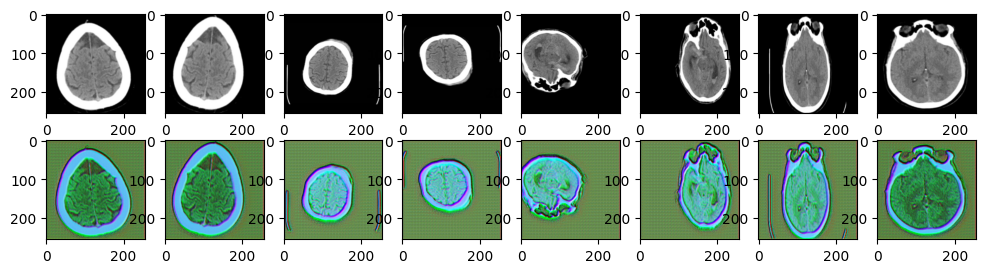

Target to Source Samples


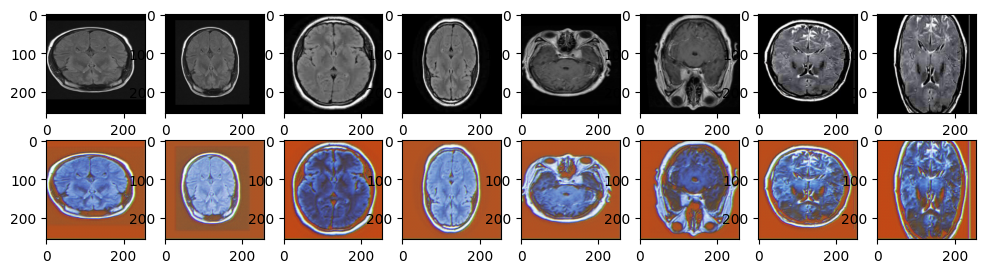

Epoch: 100/1000
source_discr: 0.6299149990081787, target_discr: 1.058980107307434 source_ADV: 0.5765901654958725, target_ADV: 0.3430340960621834 
recon_target_loss :0.05674153193831444, recon_source_loss: 0.08391521126031876 
Normal Log loss: 1.9580535888671875
Source to Target Samples


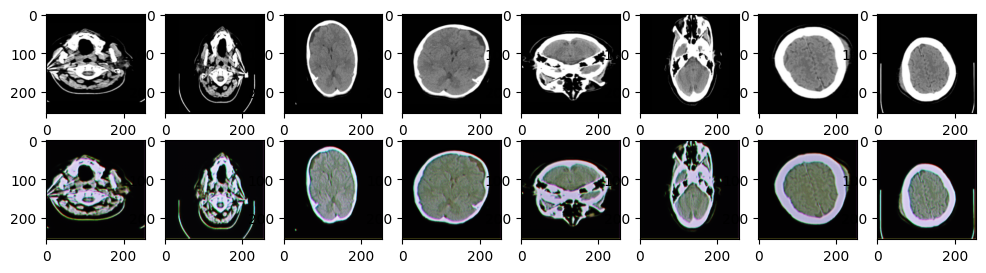

Target to Source Samples


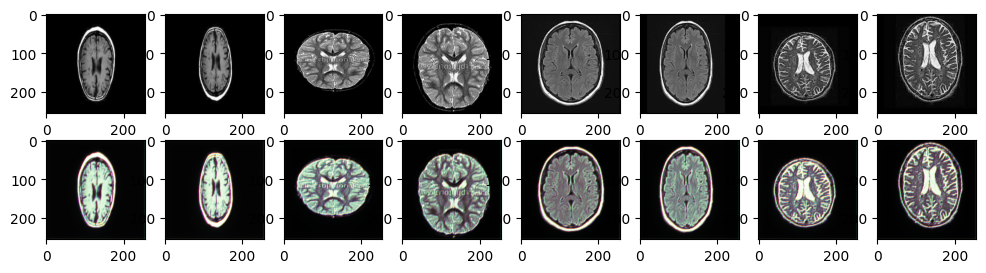

Epoch: 200/1000
source_discr: 0.7151302099227905, target_discr: 0.9543301463127136 source_ADV: 0.30304763466119766, target_ADV: 0.39341334998607635 
recon_target_loss :0.0378953292965889, recon_source_loss: 0.05550304427742958 
Normal Log loss: 1.9115999341011047
Source to Target Samples


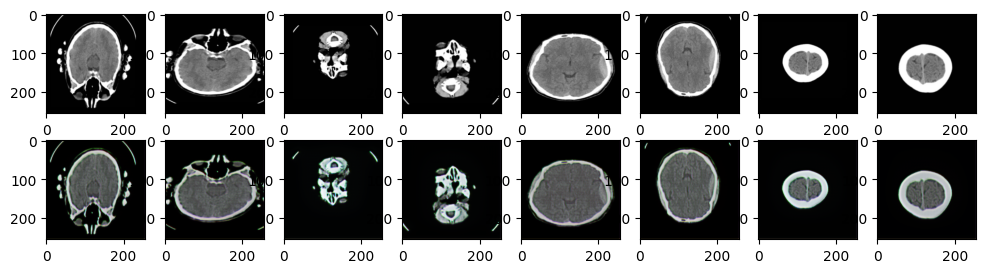

Target to Source Samples


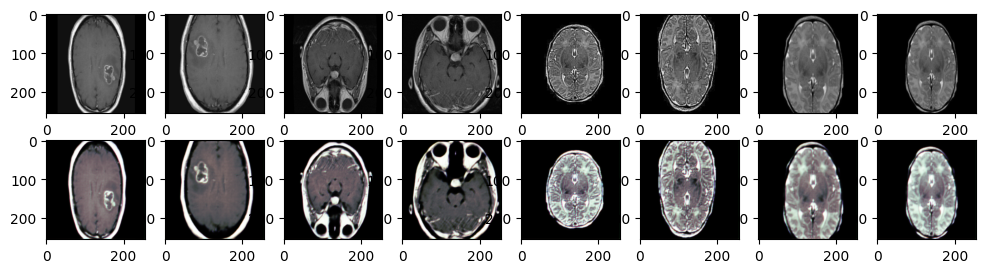

Epoch: 300/1000
source_discr: 0.8687698841094971, target_discr: 0.7495070695877075 source_ADV: 0.46392572671175003, target_ADV: 0.3568737208843231 
recon_target_loss :0.04671560227870941, recon_source_loss: 0.06083982437849045 
Normal Log loss: 1.8990490436553955
Source to Target Samples


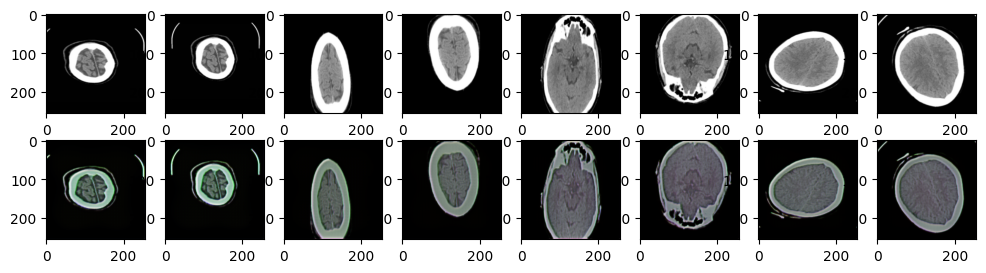

Target to Source Samples


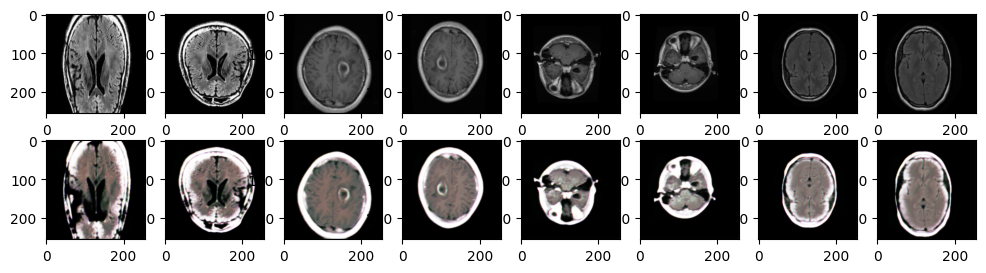

Epoch: 400/1000
source_discr: 0.7268739342689514, target_discr: 1.1639348268508911 source_ADV: 0.5483250990509987, target_ADV: 0.536834716796875 
recon_target_loss :0.034771401435136795, recon_source_loss: 0.09319905936717987 
Normal Log loss: 1.8855230808258057
Source to Target Samples


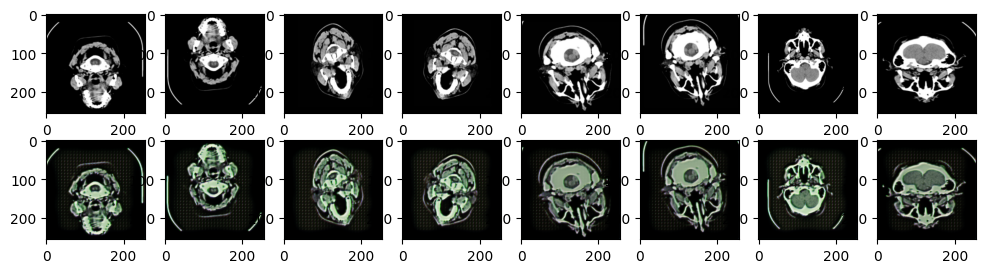

Target to Source Samples


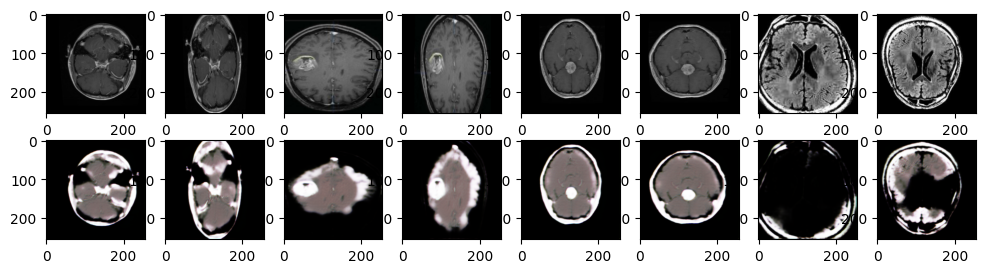

Epoch: 500/1000
source_discr: 0.7278995513916016, target_discr: 0.8076372146606445 source_ADV: 0.3610396087169647, target_ADV: 0.2874789983034134 
recon_target_loss :0.035650745034217834, recon_source_loss: 0.08628062903881073 
Normal Log loss: 1.8872277736663818
Source to Target Samples


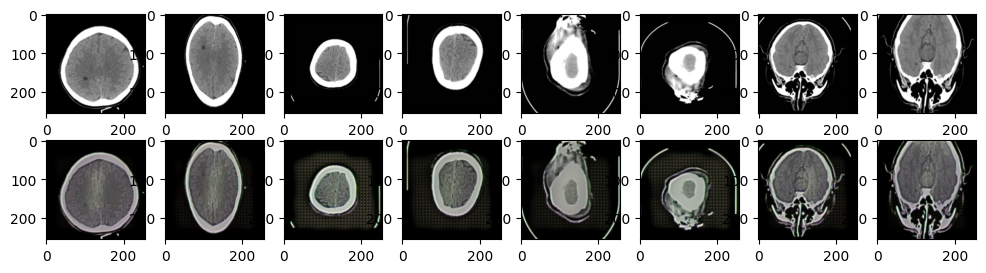

Target to Source Samples


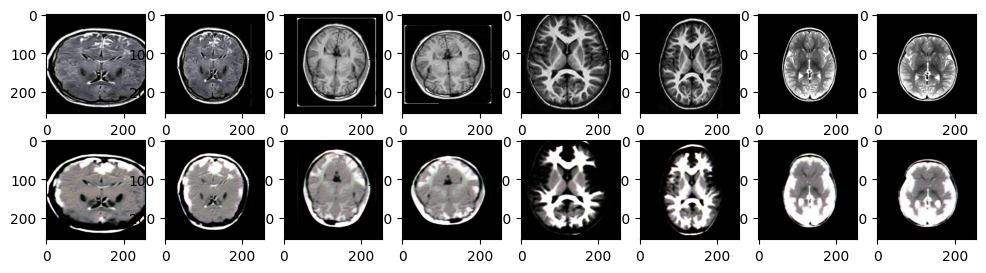

Epoch: 600/1000
source_discr: 1.1006417274475098, target_discr: 0.6045202612876892 source_ADV: 0.34427059441804886, target_ADV: 0.22087091952562332 
recon_target_loss :0.040273647755384445, recon_source_loss: 0.08169177174568176 
Normal Log loss: 1.870296597480774
Source to Target Samples


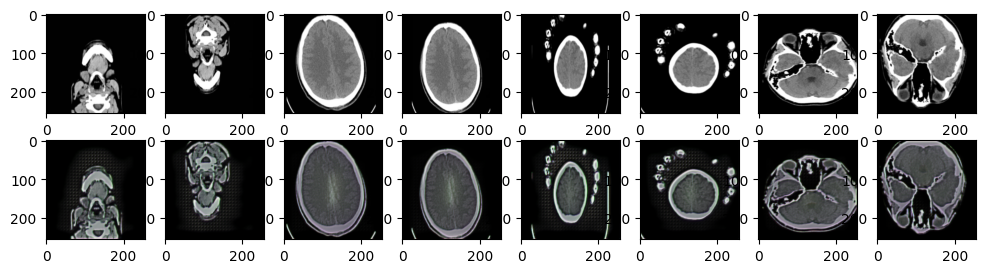

Target to Source Samples


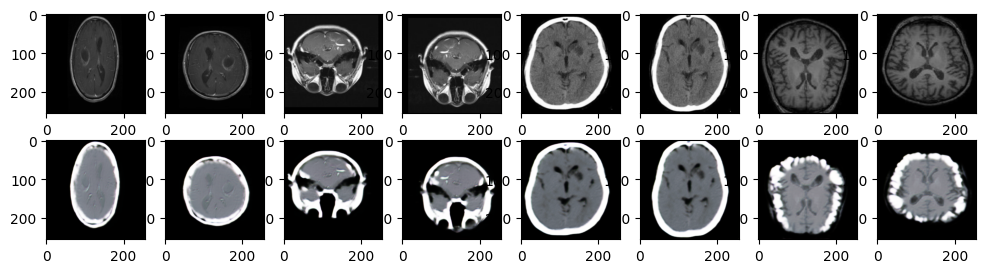

Epoch: 700/1000
source_discr: 0.8201378583908081, target_discr: 1.0937931537628174 source_ADV: 0.4547620937228203, target_ADV: 0.5231796577572823 
recon_target_loss :0.05734274163842201, recon_source_loss: 0.08720757067203522 
Normal Log loss: 1.8752436637878418
Source to Target Samples


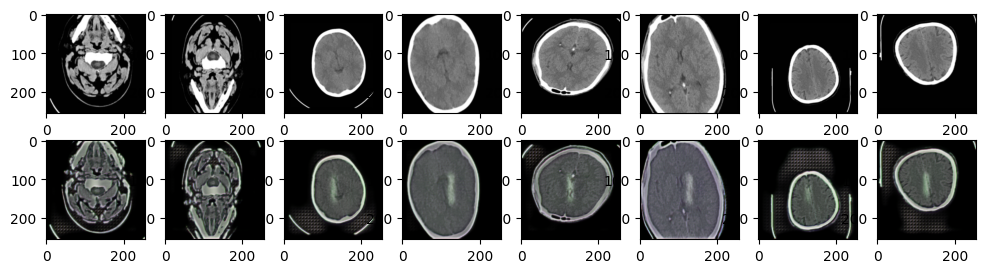

Target to Source Samples


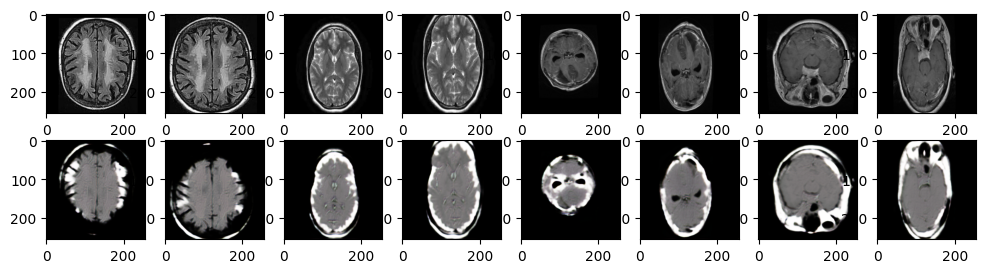

Epoch: 800/1000
source_discr: 0.781598687171936, target_discr: 0.6036182641983032 source_ADV: 0.5156316980719566, target_ADV: 0.29128608852624893 
recon_target_loss :0.05916788429021835, recon_source_loss: 0.09448076784610748 
Normal Log loss: 1.869368314743042
Source to Target Samples


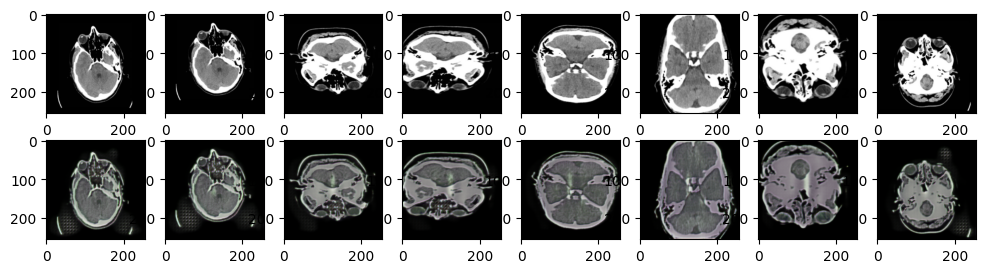

Target to Source Samples


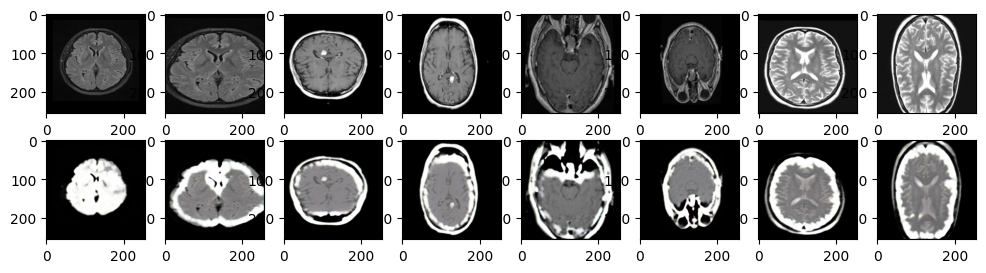

Epoch: 900/1000
source_discr: 0.801421046257019, target_discr: 0.7554807662963867 source_ADV: 0.676190972328186, target_ADV: 0.366961233317852 
recon_target_loss :0.05801919847726822, recon_source_loss: 0.06328748166561127 
Normal Log loss: 1.8714441657066345
Source to Target Samples


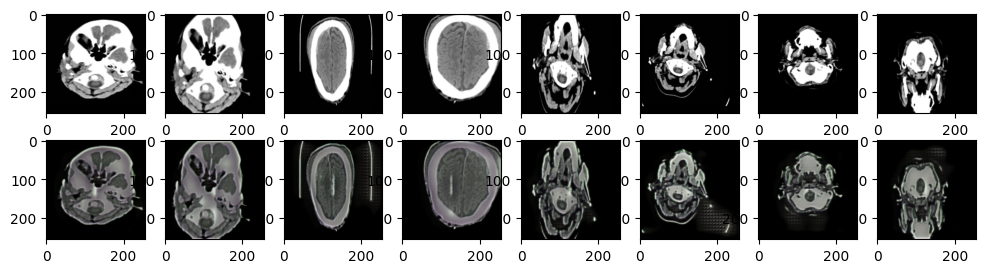

Target to Source Samples


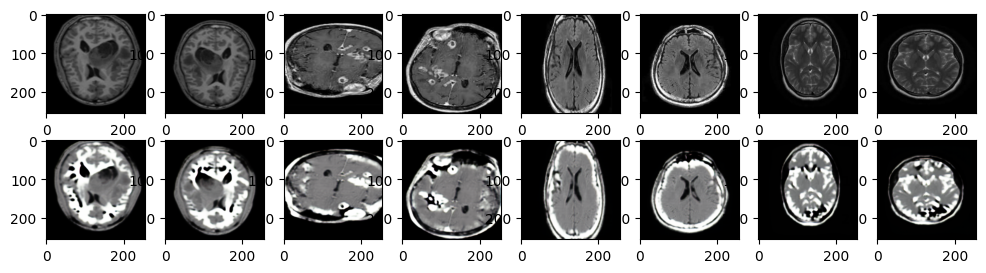

In [31]:
epochs = 1000
batch_size = 4
batch_after_augmentation = batch_size*2
patchGan = (batch_after_augmentation, 2, 2, 1)
patchGan1 = (batch_after_augmentation, 8, 8, 1)
patchGan2 = (batch_after_augmentation, 16, 16, 1)
patchGan3 = (batch_after_augmentation, 32, 32, 1)
for i in range(epochs):
    indexs = np.random.randint(1740, size = (batch_size,))
    source_images = data_augmentation(read_images(source_pathes[indexs]))
    target_images = data_augmentation(read_images(target_pathes[indexs]))
    real_source = source_images
    real_target = target_images
    fake_source = g_source.predict(real_target, verbose = 0)
    fake_target = g_target.predict(real_source, verbose = 0)
    allImagesSource = np.vstack([real_source, fake_source])
    allImagesTarget = np.vstack([real_target, fake_target])
    all_d_source, d1, d2, d3, d4  = d_source.train_on_batch(allImagesSource, [getPatchGan(patchGan),
                                                                              getPatchGan(patchGan1),
                                                                              getPatchGan(patchGan2),
                                                                              getPatchGan(patchGan3)])
    all_d_target, dt1, dt2, dt3, dt4  = d_target.train_on_batch(allImagesTarget, [getPatchGan(patchGan),
                                                                              getPatchGan(patchGan1),
                                                                              getPatchGan(patchGan2),
                                                                              getPatchGan(patchGan3)])
    all_loss, loss_1_1, loss_1_2, loss_1_3, loss_1_4, loss_2_1, loss_2_2, loss_2_3, loss_2_4, loss_3, loss_4, nloss1, nloss2 = gan.train_on_batch([real_source, real_target],
                                                       [[ones(patchGan),ones(patchGan1), ones(patchGan2), ones(patchGan3)],
                                                       [ones(patchGan),ones(patchGan1), ones(patchGan2), ones(patchGan3)],
                                                       real_source,
                                                       real_target,
                                                       get_normal_samples(batch_after_augmentation),
                                                       get_normal_samples(batch_after_augmentation)])
    if i%200 == 0:
        save_weight(g_target, g_source, d_source, d_target)
    if i%100 == 0:
        print('Epoch: {}/{}'.format(i, epochs))
        str_ = 'source_discr: {}, target_discr: {}'.format(all_d_source, all_d_target)
        str_2 = 'source_ADV: {}, target_ADV: {}'.format((loss_1_1 + loss_1_2 + loss_1_3 + loss_1_4)/4,
                                                            (loss_2_1 + loss_2_2 + loss_2_3 + loss_2_4)/4)
        str_3 = 'recon_target_loss :{}, recon_source_loss: {}'.format(loss_3, loss_4)
        print(str_ + ' ' +str_2 + ' ')
        print(str_3 + ' ')
        print('Normal Log loss: {}'.format((nloss1 + nloss2)))
        print('Source to Target Samples')
        samples(g_target, real_source)
        print('Target to Source Samples')
        samples(g_source, real_target)

In [23]:
save_weight(g_target, g_source, d_source, d_target)

In [24]:
def draw_compare(road_ligh,
                 road_night, type_):
  plt.figure(figsize = (12, 16))
  index = 0
  n = 0
  for i in range(36):
    plt.subplot(6, 6, (i + 1))
    if index == 0:
      plt.imshow(road_night[n])
      plt.title(type_[0])
      index = 1
    elif index == 1:
      plt.imshow(road_ligh[n])
      plt.title(type_[1])
      index = 0
      n = n + 1
  plt.legend()

In [25]:
def generator_samples(pathes_, m, type_):
  indexs = np.random.randint(1700, size = (18,))
  images = read_images(pathes_[indexs])
  draw_compare(np.squeeze(m.predict(images, verbose = 0)), images, type_)

# Results:


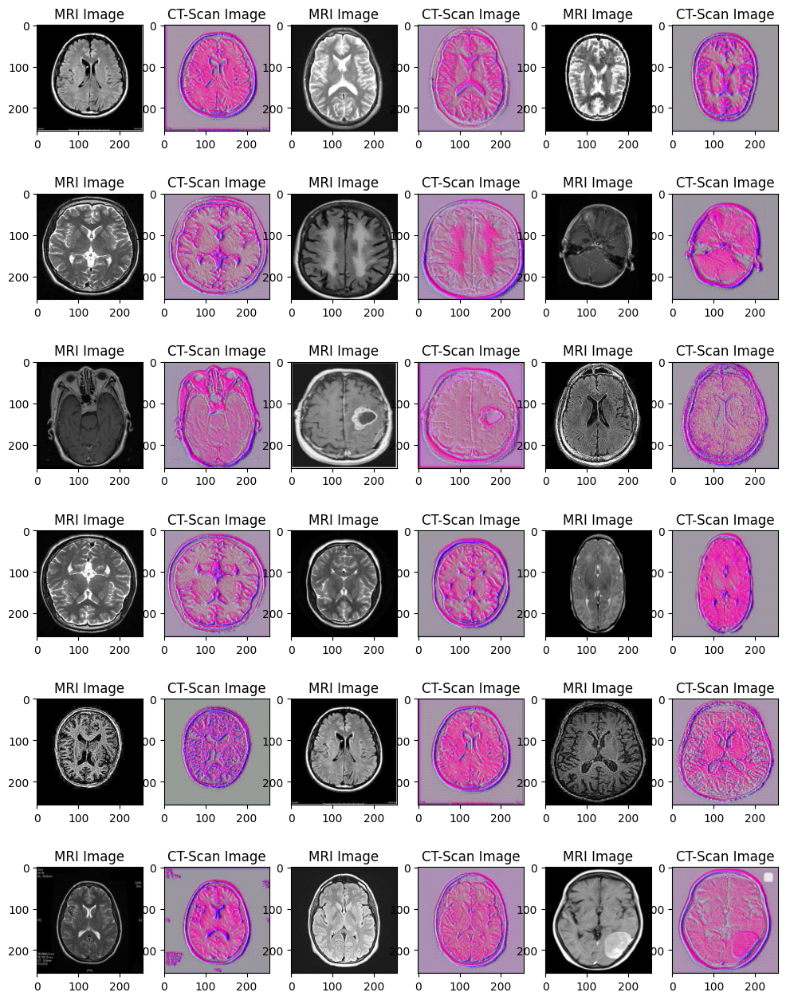

In [26]:
generator_samples(target_pathes, g_source, ['MRI Image', 'CT-Scan Image'])

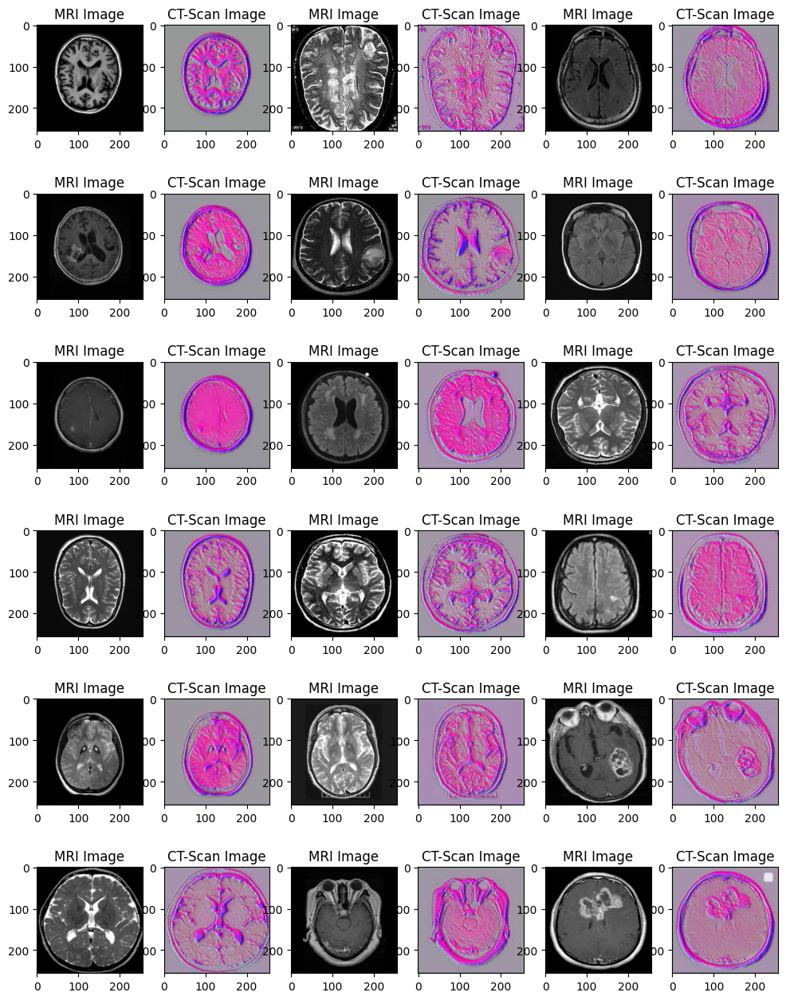

In [27]:
generator_samples(target_pathes, g_source, ['MRI Image', 'CT-Scan Image'])

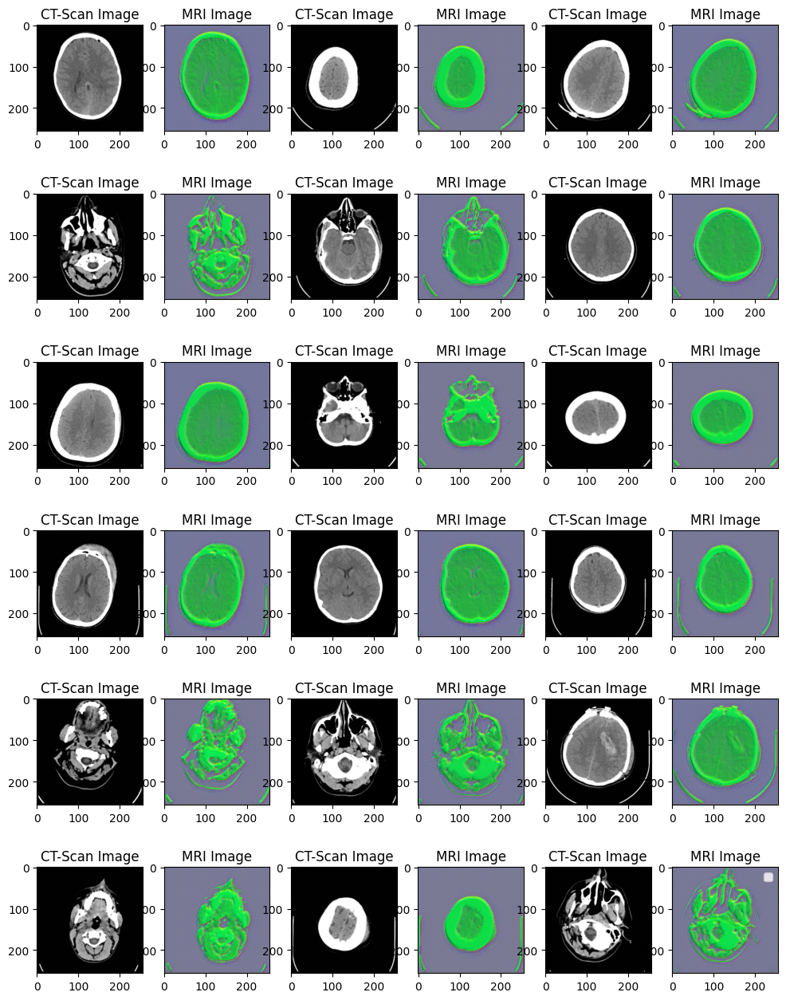

In [28]:
generator_samples(source_pathes, g_target, ['CT-Scan Image', 'MRI Image'])

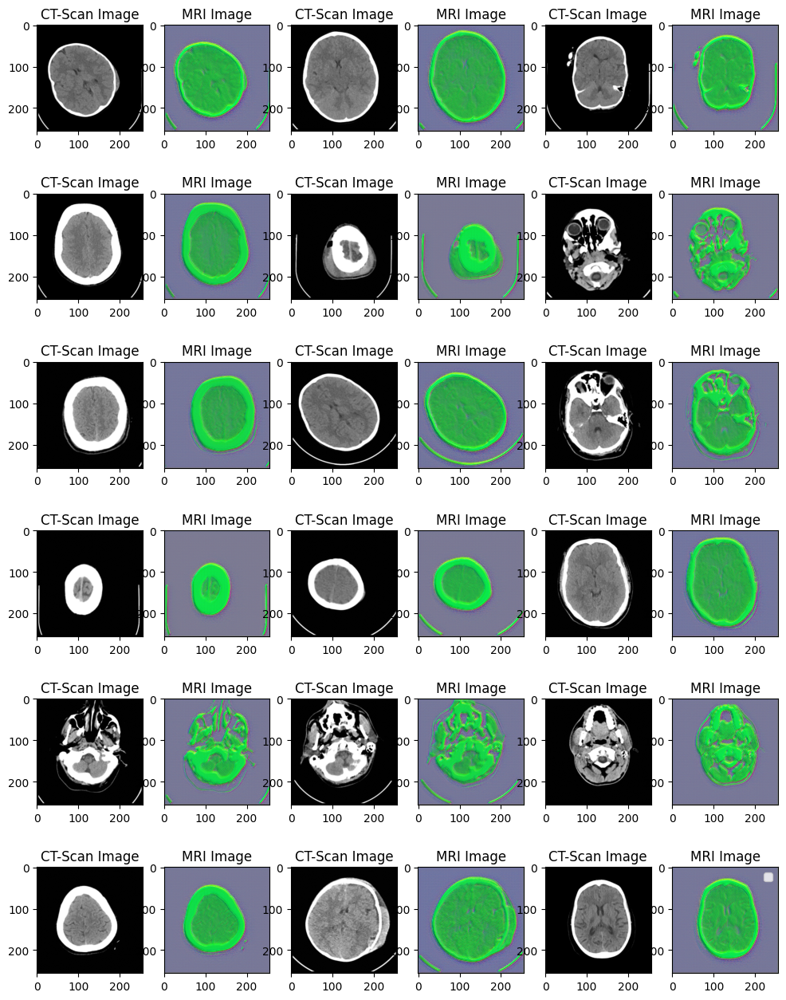

In [29]:
generator_samples(source_pathes, g_target, ['CT-Scan Image', 'MRI Image'])

# Test Generation:

In [30]:
def draw_samples(road_ligh,
                 road_night, type_):
  plt.figure(figsize = (12, 9))
  index = 0
  n = 0
  for i in range(24):
    plt.subplot(4, 6, (i + 1))
    if index == 0:
      plt.imshow(road_night[n])
      plt.title(type_[0])
      index = 1
    elif index == 1:
      plt.imshow(road_ligh[n])
      plt.title(type_[1])
      index = 0
      n = n + 1
  plt.legend()

In [31]:
ct_pathes = np.array(sorted(list(pathlib.Path('/kaggle/input/ct-mri/Dataset/unseen_demo_images/ct').glob('*.*'))))
mri_pathes = np.array(sorted(list(pathlib.Path('/kaggle/input/ct-mri/Dataset/unseen_demo_images/mri').glob('*.*'))))

In [32]:
ctImagesGeneration = g_source.predict(g_target.predict(read_images(ct_pathes)))
ctImagesGeneration.shape

1/1 [==============================] - 0s 47ms/step


(15, 256, 256, 3)

In [33]:
ctOrginalImages = read_images(ct_pathes)
ctOrginalImages.shape

(15, 256, 256, 3)

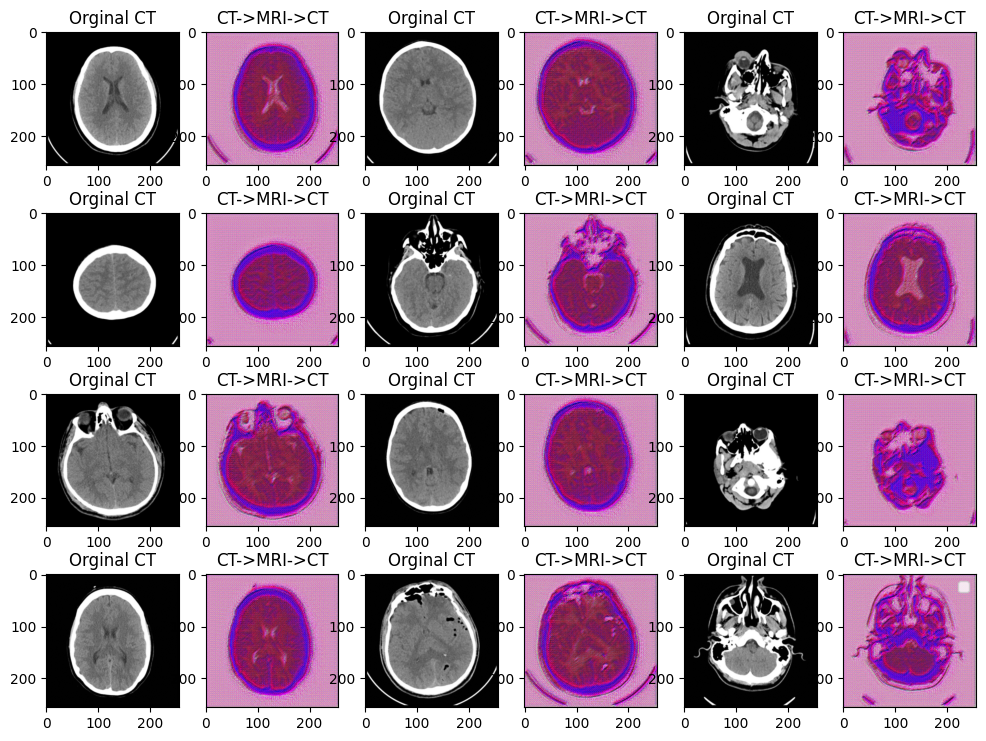

In [34]:
draw_samples(ctImagesGeneration, ctOrginalImages, ['Orginal CT', 'CT->MRI->CT'])

In [35]:
loss_value = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.keras.layers.Flatten()(ctOrginalImages),
                                                 tf.keras.layers.Flatten()(ctImagesGeneration)))
loss_value

<tf.Tensor: shape=(), dtype=float32, numpy=1.2563156>

In [36]:
mriImagesGeneration = g_target.predict(g_source.predict(read_images(mri_pathes)))
mriImagesGeneration.shape

1/1 [==============================] - 0s 46ms/step


(15, 256, 256, 3)

In [37]:
mriOrginalImages = read_images(mri_pathes)
mriOrginalImages.shape

(15, 256, 256, 3)

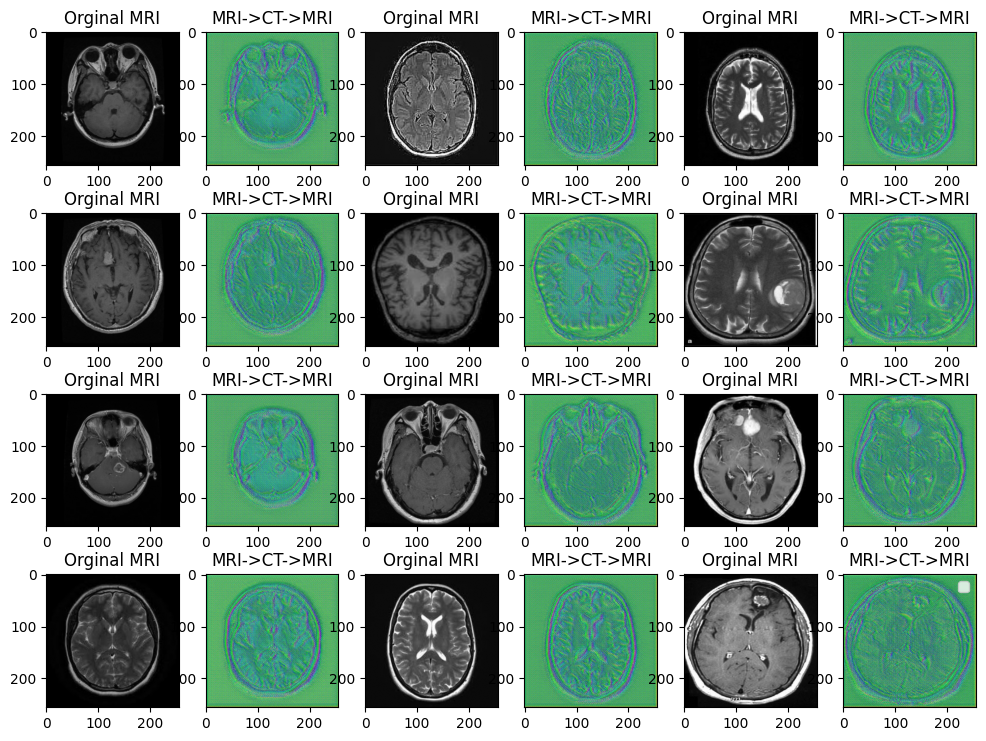

In [38]:
draw_samples(mriImagesGeneration, mriOrginalImages, ['Orginal MRI', 'MRI->CT->MRI'])

In [39]:
loss_value = tf.reduce_mean(tf.keras.losses.binary_crossentropy(tf.keras.layers.Flatten()(mriOrginalImages),
                                                 tf.keras.layers.Flatten()(mriImagesGeneration)))
loss_value

<tf.Tensor: shape=(), dtype=float32, numpy=0.70758915>